In [1]:
import numpy as np
import matplotlib.pyplot as plt

import os

In [2]:
control_dir = '../control_images/'
penetramax_dir = '../penetramax_images/'

control_fnames = [control_dir + fname for fname in os.listdir(control_dir)]
penetramax_fnames = [penetramax_dir + fname for fname in os.listdir(penetramax_dir)]

control_fnames

['../control_images/010_z67.png',
 '../control_images/009_z70.png',
 '../control_images/005_z41.png',
 '../control_images/002_z54.png',
 '../control_images/003_z56.png',
 '../control_images/007_z62.png',
 '../control_images/006_z72.png',
 '../control_images/001_z26.png',
 '../control_images/008_z69.png',
 '../control_images/004_z62.png']

In [3]:
def show_image(fname, save_to=None):
    from matplotlib.pyplot import imread, subplots, delaxes, subplots_adjust, show, savefig
    from numpy import arange

    im = imread(fname)
    Nx, Ny, _ = im.shape
    
    red = im[:,:,0]
    blue = im[:,:,1]

    fig, axes = subplots(2, 2, gridspec_kw={'width_ratios': [4,1], 'height_ratios': [4,1]}, dpi=300)
    delaxes(axes[1,1])
    subplots_adjust(hspace=0, wspace=0)

    main, bottom, right = axes[0,0], axes[1,0], axes[0,1]

    main.imshow(im, origin='lower', aspect='auto')
    main.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
    main.set_ylabel(r'1$^\text{st}$ axis'); main.set_xlabel(r'0$^\text{th}$ axis')
    main.xaxis.set_label_position('top')

    bottom.fill_between(arange(Ny), red.sum(axis=0), color='r', alpha=0.5); bottom.fill_between(arange(Ny), blue.sum(axis=0), color='b', alpha=0.5)
    bottom.plot(arange(Ny), red.sum(axis=0), color='r'); bottom.plot(arange(Ny), blue.sum(axis=0), color='b')

    right.fill_betweenx(arange(Nx), red.sum(axis=1), color='r', alpha=0.5); right.fill_betweenx(arange(Nx), blue.sum(axis=1), color='b', alpha=0.5)
    right.plot(red.sum(axis=1), arange(Nx), color='r'); right.plot(blue.sum(axis=1), arange(Nx), color='b')

    bottom.set_yticks([]); bottom.set_xlim(0, Ny); bottom.set_ylim(0)
    right.set_xticks([]); right.set_ylim(0, Nx); right.set_xlim(0); right.invert_xaxis()
    right.tick_params(labelleft=False, right=True, labelright=True)

    if save_to is not None:
        savefig(save_to, dpi=300, bbox_inches='tight')

    show()

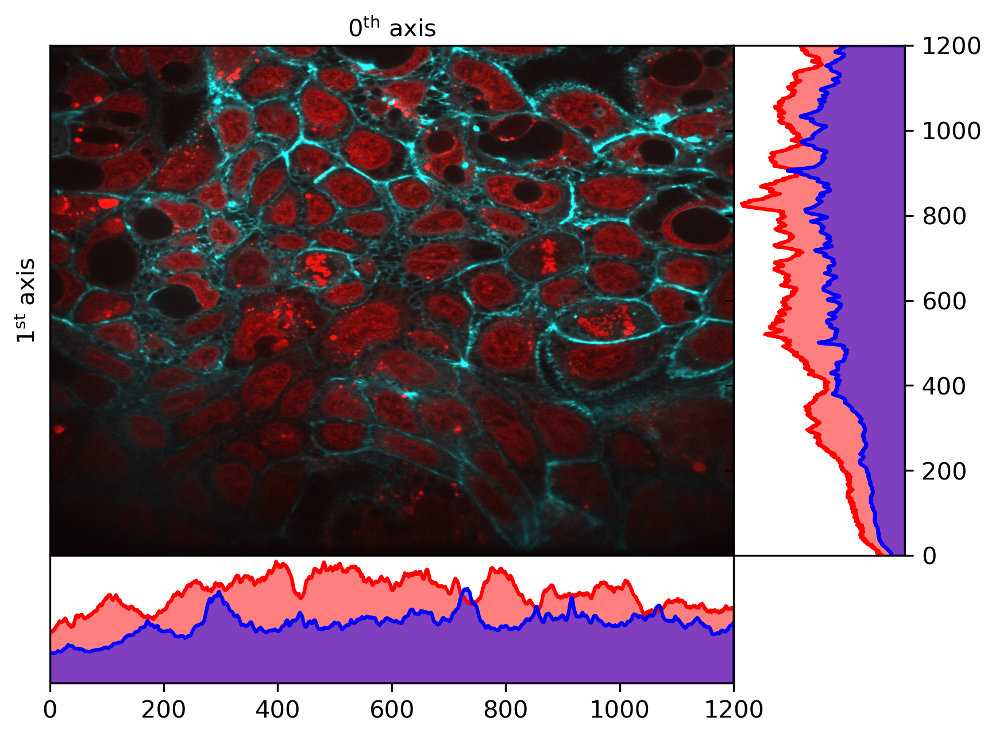

In [4]:
show_image(control_fnames[0], save_to='test.png')

In [5]:
def perform_hist_equalisation(image, nbins=256):
    from skimage.exposure import equalize_hist
    from numpy import stack

    red_corrected = equalize_hist(image[:,:,0], nbins=nbins)
    blue_corrected = equalize_hist(image[:,:,1], nbins=nbins)

    return stack([red_corrected, blue_corrected, blue_corrected], axis=2)

def perform_adapthist_equalisation(image, nbins=256):
    from skimage.exposure import equalize_adapthist
    from numpy import stack

    red_corrected = equalize_adapthist(image[:,:,0], nbins=nbins)
    blue_corrected = equalize_adapthist(image[:,:,1], nbins=nbins)

    return stack([red_corrected, blue_corrected, blue_corrected], axis=2)

In [6]:
dir_hist = '../corrected_images/hist_correction/'
dir_adapthist = '../corrected_images/adapthist_correction/'

In [13]:
from PIL.Image import fromarray

for fname in control_fnames + penetramax_fnames:
    final_path = dir_hist + fname.split('/')[-1]

    im = perform_hist_equalisation(plt.imread(fname))
    im = (255 * im).astype(np.uint8)

    fromarray(im).save(final_path)

for fname in control_fnames + penetramax_fnames:
    final_path = dir_adapthist + fname.split('/')[-1]

    im = perform_adapthist_equalisation(plt.imread(fname))
    im = (255 * im).astype(np.uint8)

    fromarray(im).save(final_path)

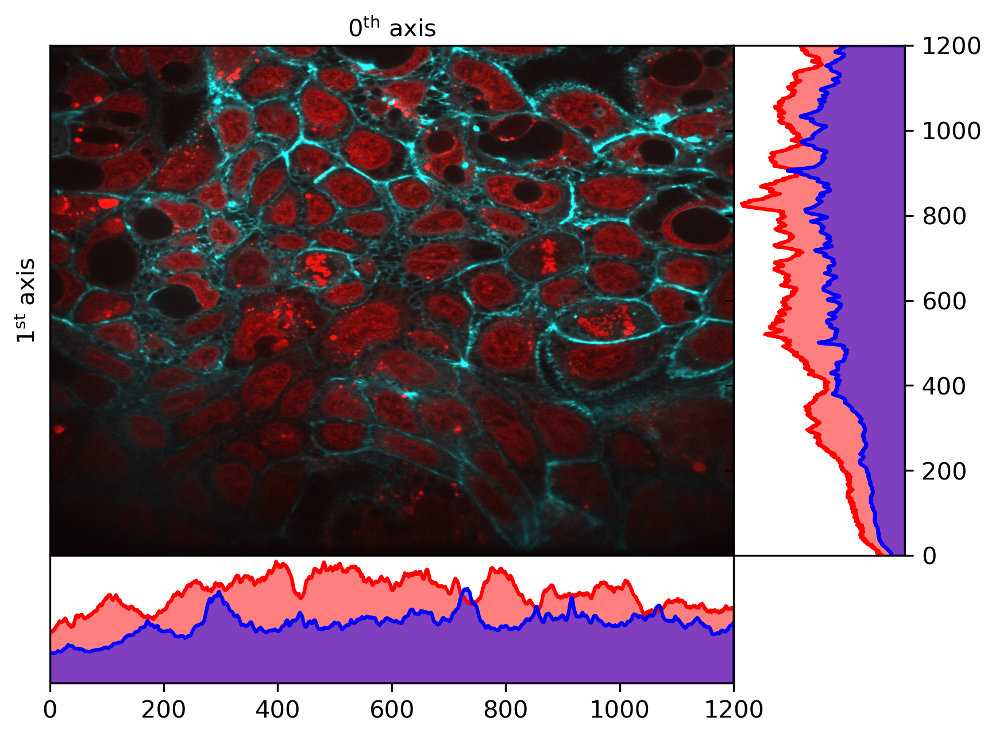

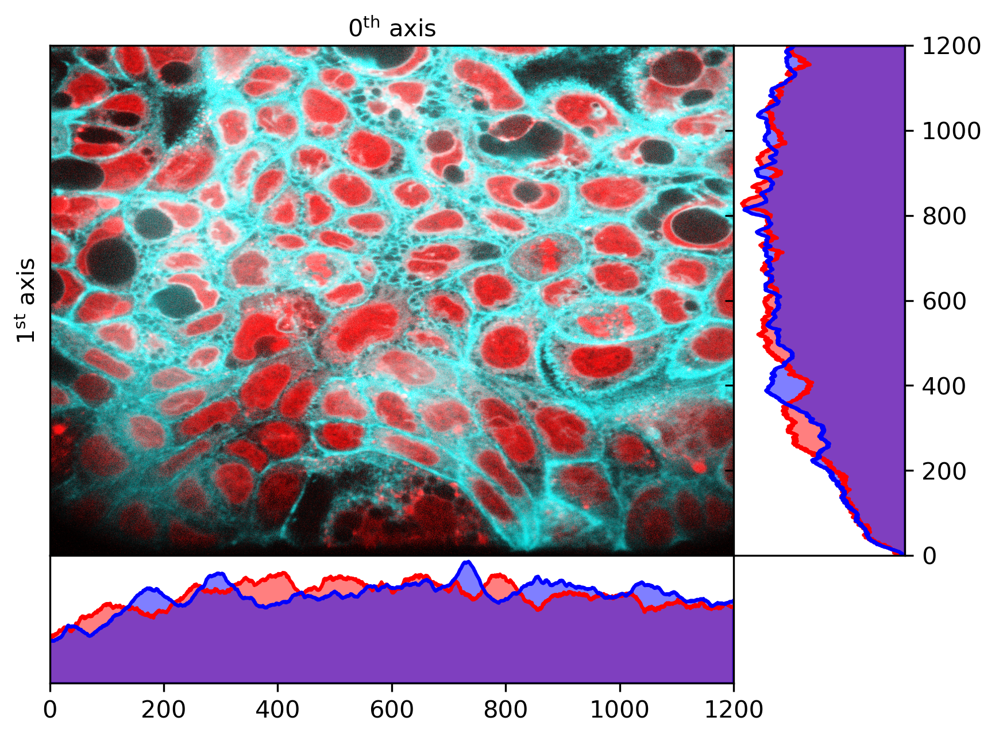

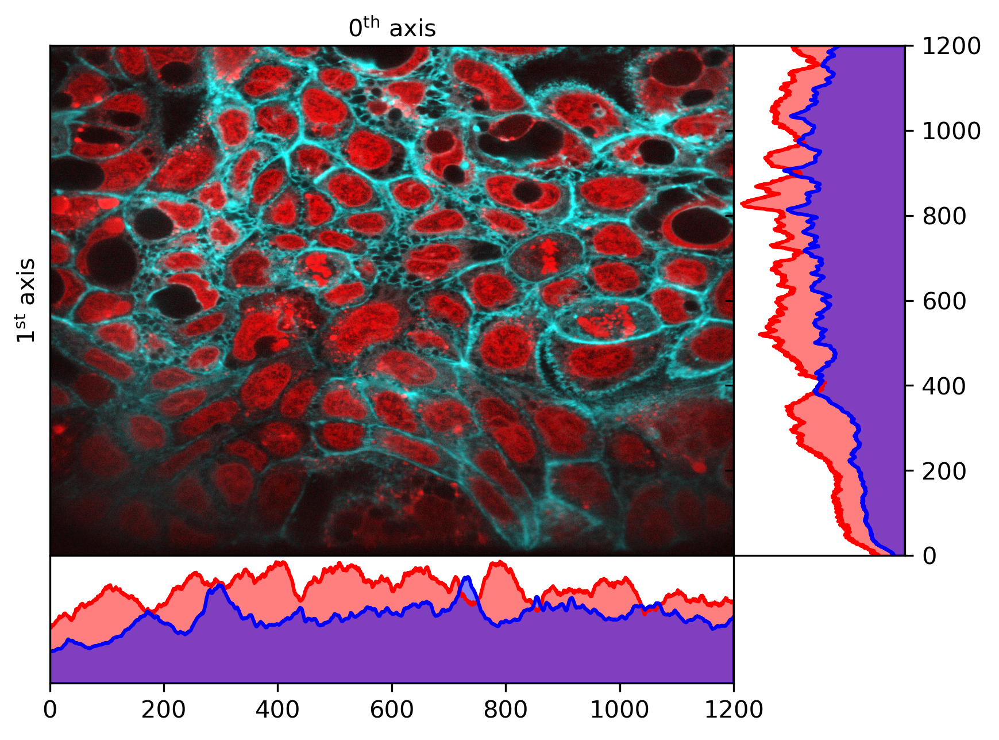

In [17]:
fname = control_fnames[0].split('/')[-1]

path1 = control_dir + fname
path2 = dir_hist + fname
path3 = dir_adapthist + fname

show_image(path1)
show_image(path2)
show_image(path3)